In [1]:
import os
import random
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
plt.style.use("ggplot")
%matplotlib inline

from tqdm.notebook import tqdm_notebook, tnrange
from tqdm import tqdm
from itertools import chain
from skimage.io import imread, imshow, concatenate_images
from skimage.transform import resize
from skimage.morphology import label
from sklearn.model_selection import train_test_split

import tensorflow as tf

from keras.models import Model, load_model
from keras.layers import Input, BatchNormalization, Activation, Dense, Dropout
from keras.layers.core import Lambda, RepeatVector, Reshape
from keras.layers.convolutional import Conv2D, Conv2DTranspose
from keras.layers.pooling import MaxPooling2D, GlobalMaxPool2D
from tensorflow.keras.layers import concatenate,add
from keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.utils import img_to_array,load_img,array_to_img
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.preprocessing import LabelEncoder
from keras.utils import to_categorical
from sklearn.utils import class_weight

import glob

In [2]:
import tensorflow as tf
device_name = tf.test.gpu_device_name()
if device_name != '/device:GPU:0':
  raise SystemError('GPU device not found')
print('Found GPU at: {}'.format(device_name))

Found GPU at: /device:GPU:0


In [3]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [4]:
!unzip "/content/drive/My Drive/Dataset_Capstone/test.zip"

Archive:  /content/drive/My Drive/Dataset_Capstone/test.zip
   creating: test/
   creating: test/SS_EA001/
  inflating: __MACOSX/test/._SS_EA001  
  inflating: test/.DS_Store          
  inflating: __MACOSX/test/._.DS_Store  
   creating: test/SS_EA041/
  inflating: __MACOSX/test/._SS_EA041  
   creating: test/SS_EA025/
  inflating: __MACOSX/test/._SS_EA025  
   creating: test/SS_EA034/
   creating: test/SS_EA002/
  inflating: __MACOSX/test/._SS_EA002  
  inflating: test/SS_EA001/EA_001_VarFat_293_mask.png  
  inflating: __MACOSX/test/SS_EA001/._EA_001_VarFat_293_mask.png  
  inflating: test/SS_EA001/EA_001_VarFat_285_mask.png  
  inflating: __MACOSX/test/SS_EA001/._EA_001_VarFat_285_mask.png  
  inflating: test/SS_EA001/EA_001_VarFat_285_img.png  
  inflating: __MACOSX/test/SS_EA001/._EA_001_VarFat_285_img.png  
  inflating: test/SS_EA001/EA_001_VarFat_290_img.png  
  inflating: __MACOSX/test/SS_EA001/._EA_001_VarFat_290_img.png  
  inflating: test/SS_EA001/EA_001_VarFat_280_img.png  

In [5]:
!unzip "/content/drive/My Drive/Dataset_Capstone/train_local.zip"

Archive:  /content/drive/My Drive/Dataset_Capstone/train_local.zip
   creating: train_local/
   creating: train_local/SS_EA031/
  inflating: train_local/.DS_Store   
  inflating: __MACOSX/train_local/._.DS_Store  
   creating: train_local/SS_045/
   creating: train_local/EA036_SS/
   creating: train_local/SS/
   creating: train_local/SS_EA_050/
   creating: train_local/SS_3/
   creating: train_local/SS_EA026/
  inflating: train_local/SS_EA031/EA031_860_img.png  
  inflating: train_local/SS_EA031/EA031_908_img.png  
  inflating: train_local/SS_EA031/EA031_815_mask.png  
  inflating: train_local/SS_EA031/EA031_779_mask.png  
  inflating: train_local/SS_EA031/EA031_767_img.png  
  inflating: train_local/SS_EA031/EA031_812_img.png  
  inflating: train_local/SS_EA031/EA031_887_mask.png  
  inflating: train_local/SS_EA031/EA031_863_mask.png  
  inflating: train_local/SS_EA031/EA031_884_img.png  
  inflating: train_local/SS_EA031/EA031_923_mask.png  
  inflating: train_local/SS_EA031/EA031_91

In [7]:
def count_img(root, total, folders, total_count, text):
    for filename in tqdm(os.listdir(root)):
        if filename != ".DS_Store":
            folders.append(filename)
            ids = next(os.walk(root+'/'+filename))[2]# list of names all images in the given path
            total_count.append(len(ids))
            total +=len(ids)
    print(text)
    print("Number of images and masks = ", total)
    print("The folders containing images and masks are :", folders)
    print("Image tally accordingly :", total_count)
    return total, folders, total_count

In [8]:
def mac_equalizer(total_count):
    for i in range(len(total_count)):
        if total_count[i] % 2 != 0 :
            total_count[i] -= 1
    print("New count is :", total_count)
    print("New total = ", sum(total_count))
    return total_count,sum(total_count)

In [9]:
def label_maker(masks):
  labelencoder = LabelEncoder()
  n, h, w, _ = masks.shape
  masks_reshaped = masks.reshape(-1,1)
  masks_reshaped_encoded = labelencoder.fit_transform(masks_reshaped)
  masks_encoded_original_shape = masks_reshaped_encoded.reshape(n, h, w)
  masks_input = np.expand_dims(masks_encoded_original_shape, axis=3)
  print(np.unique(masks_encoded_original_shape), masks_input.shape)
  return masks_input, masks_reshaped_encoded

In [10]:
def upload(root, folders, X, y, text):
    count_img = 0
    count_mask = 0
    
    print(text)
    
    for file in folders : 
        image_dir_path = root+ "/" +file
        mask_dir_path =  root+ "/" +file
        
        for img_path in tqdm(sorted(glob.glob(os.path.join(image_dir_path, "*_img.png")))):
            img = load_img(img_path, color_mode = "grayscale")
            img = img_to_array(img)
            img = resize(img, (512, 512, 1), mode = 'constant', preserve_range = True)
            img = img/255.0
            X[count_img]=img 
            count_img+=1
        print("Image upload count = ", count_img)
        
        
        for mask_path in tqdm(sorted(glob.glob(os.path.join(mask_dir_path, "*_mask.png")))):
            mask = load_img(mask_path, color_mode = "grayscale")
            mask = img_to_array(mask)
            mask = resize(mask, (512, 512, 1), mode = 'constant', preserve_range = True)
            mask = mask/255.0
            y[count_mask]=mask
            count_mask+=1
        print("Mask upload count = ", count_mask)
    return X,y

In [11]:
def pre_visualize(X, y, text, ix = None) :
    
    print(text)
    for i in range(5) : 
        if ix == None :
            ix = random.randint(0, len(X)-1)
        
        fig, (ax1, ax2) = plt.subplots(1, 2, figsize = (20, 15))
        ax1.imshow(X[ix], cmap = 'gray', interpolation = 'bilinear')
        ax1.set_title('Image')
        
        ax2.imshow(y[ix], cmap = 'gray', interpolation = 'bilinear')
        ax2.set_title('Mask')
        ix = None

In [12]:
train_text = "\t\t\t\t\t\tTraining "
valid_text = "\t\t\t\t\t\tValidation "
test_text = "\t\t\t\t\t\t\tTesting "
train_total = 0
test_total = 0
train_total_count = []
test_total_count = []
train_folders = []
test_folders = []
train_root = "train_local"
test_root = "test"

train_total, train_folders, train_total_count = count_img(train_root, train_total, train_folders, train_total_count, "Training")
test_total, test_folders, test_total_count = count_img(test_root, test_total, test_folders, test_total_count, "Testing")


100%|██████████| 8/8 [00:00<00:00, 7722.54it/s]


Training
Number of images and masks =  457
The folders containing images and masks are : ['SS_3', 'SS', 'EA036_SS', 'SS_EA031', 'SS_EA026', 'SS_045', 'SS_EA_050']
Image tally accordingly : [42, 63, 45, 157, 43, 56, 51]


100%|██████████| 6/6 [00:00<00:00, 21454.24it/s]

Testing
Number of images and masks =  54
The folders containing images and masks are : ['SS_EA001', 'SS_EA025', 'SS_EA034', 'SS_EA041', 'SS_EA002']
Image tally accordingly : [10, 10, 13, 10, 11]


In [13]:
train_total_count, train_total = mac_equalizer(train_total_count)
test_total_count, test_total = mac_equalizer(test_total_count)

New count is : [42, 62, 44, 156, 42, 56, 50]
New total =  452
New count is : [10, 10, 12, 10, 10]
New total =  52


In [14]:
im_width = 512
im_height = 512
n_classes = 5 

X = np.zeros((int(train_total/2), im_height, im_width, 1), dtype=np.float32)
y = np.zeros((int(train_total/2), im_height, im_width, 1), dtype=np.float32)

X_test = np.zeros((int(test_total/2), im_height, im_width, 1), dtype=np.float32)
y_test = np.zeros((int(test_total/2), im_height, im_width, 1), dtype=np.float32)

In [15]:
X, y = upload(train_root, train_folders, X, y, train_text)

						Training 


100%|██████████| 21/21 [00:00<00:00, 22.76it/s]


Image upload count =  21


100%|██████████| 21/21 [00:00<00:00, 38.58it/s]


Mask upload count =  21


100%|██████████| 31/31 [00:00<00:00, 37.49it/s]


Image upload count =  52


100%|██████████| 31/31 [00:00<00:00, 41.95it/s]


Mask upload count =  52


100%|██████████| 22/22 [00:00<00:00, 39.63it/s]


Image upload count =  74


100%|██████████| 22/22 [00:00<00:00, 42.51it/s]


Mask upload count =  74


100%|██████████| 78/78 [00:01<00:00, 40.84it/s]


Image upload count =  152


100%|██████████| 78/78 [00:01<00:00, 41.93it/s]


Mask upload count =  152


100%|██████████| 21/21 [00:00<00:00, 37.01it/s]


Image upload count =  173


100%|██████████| 21/21 [00:00<00:00, 42.59it/s]


Mask upload count =  173


100%|██████████| 28/28 [00:00<00:00, 38.47it/s]


Image upload count =  201


100%|██████████| 28/28 [00:00<00:00, 42.95it/s]


Mask upload count =  201


100%|██████████| 25/25 [00:00<00:00, 33.37it/s]


Image upload count =  226


100%|██████████| 25/25 [00:00<00:00, 27.52it/s]

Mask upload count =  226


In [16]:
X_test, y_test = upload(test_root, test_folders, X_test, y_test, test_text)

							Testing 


100%|██████████| 5/5 [00:00<00:00, 26.23it/s]


Image upload count =  5


100%|██████████| 5/5 [00:00<00:00, 25.93it/s]


Mask upload count =  5


100%|██████████| 5/5 [00:00<00:00, 23.22it/s]


Image upload count =  10


100%|██████████| 5/5 [00:00<00:00, 24.76it/s]


Mask upload count =  10


100%|██████████| 6/6 [00:00<00:00, 23.80it/s]


Image upload count =  16


100%|██████████| 6/6 [00:00<00:00, 25.95it/s]


Mask upload count =  16


100%|██████████| 5/5 [00:00<00:00, 25.06it/s]


Image upload count =  21


100%|██████████| 5/5 [00:00<00:00, 27.03it/s]


Mask upload count =  21


100%|██████████| 5/5 [00:00<00:00, 25.28it/s]


Image upload count =  26


100%|██████████| 5/5 [00:00<00:00, 27.18it/s]

Mask upload count =  26


In [17]:
np.unique(y)

array([0.        , 0.24705882, 0.49803922, 0.7490196 , 1.        ],
      dtype=float32)

In [18]:
y.shape

(226, 512, 512, 1)

In [52]:
y, y_encoded = label_maker(y)
y_test, y_test_encoded = label_maker(y_test)

/usr/local/lib/python3.9/dist-packages/sklearn/preprocessing/_label.py:116: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


[0 1 2 3 4] (226, 512, 512, 1)


/usr/local/lib/python3.9/dist-packages/sklearn/preprocessing/_label.py:116: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


[0 1 2 3 4] (26, 512, 512, 1)


In [20]:
X_train, X_valid, y_train, y_valid = train_test_split(X, y, train_size = 0.8, random_state = 0)

In [21]:
len(X_train)

180

In [22]:
len(X_valid)

46

						Training 


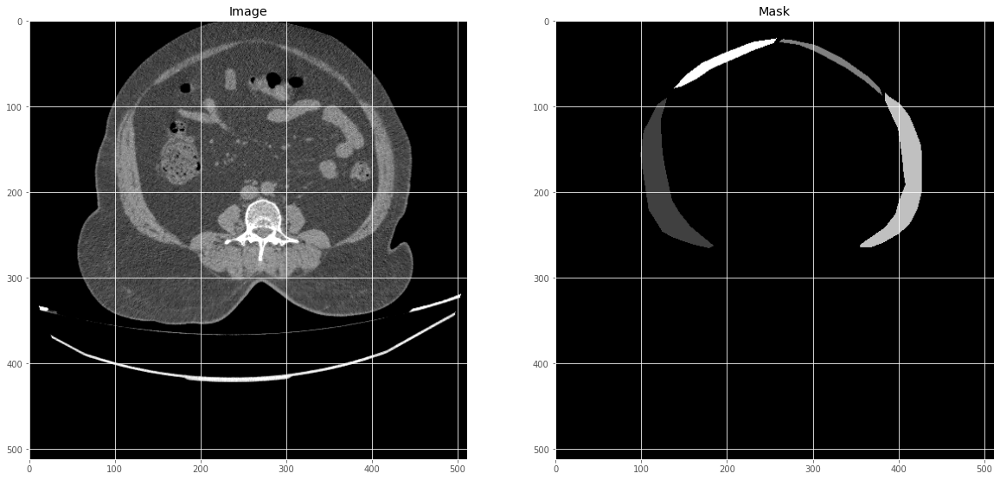

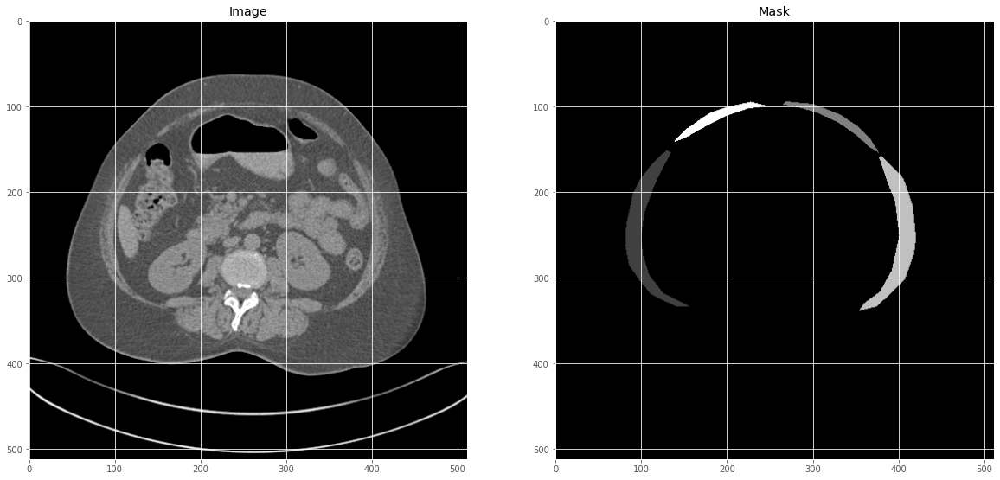

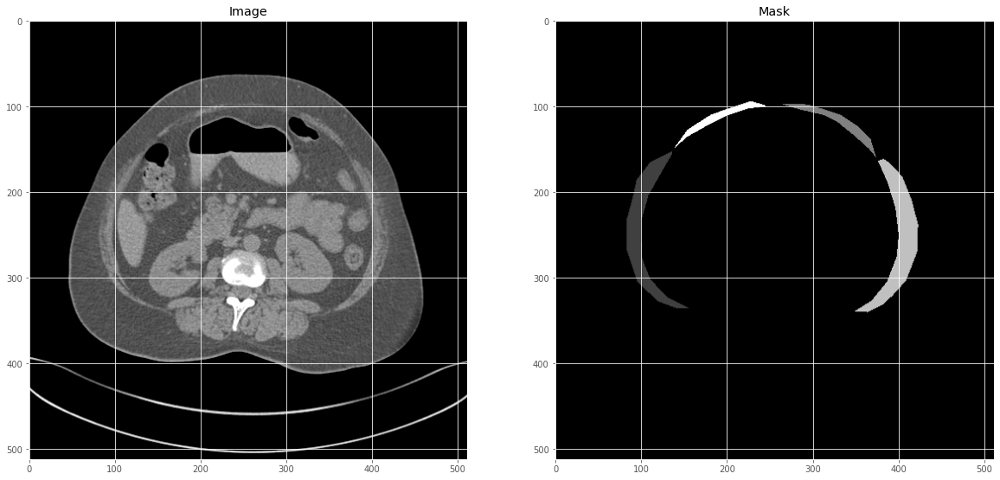

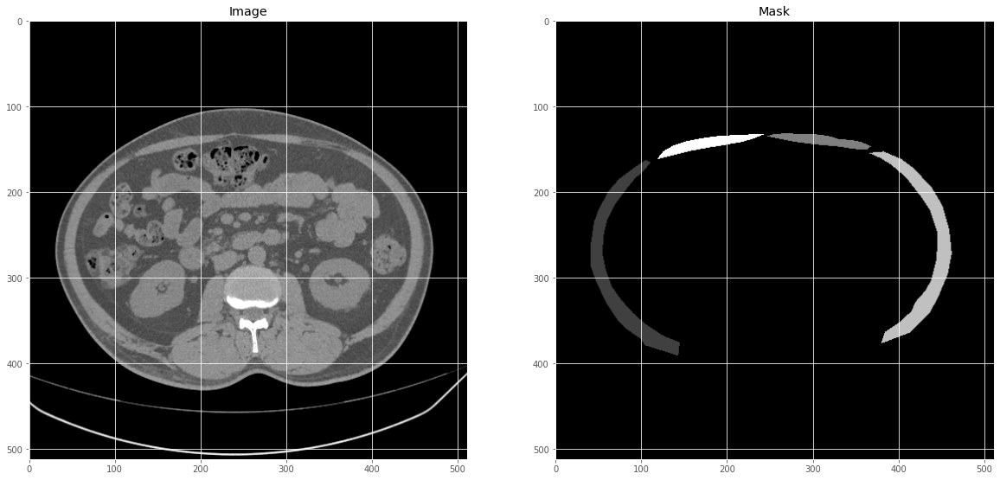

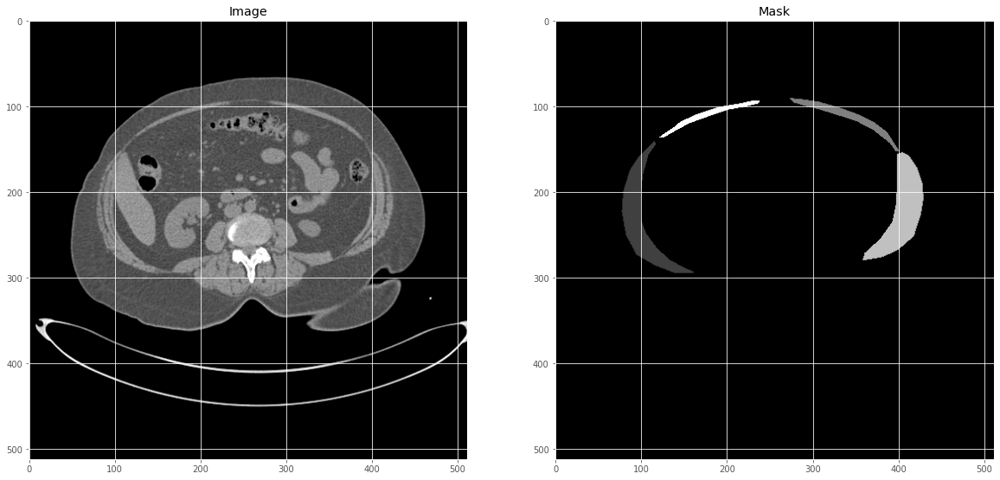

In [23]:
pre_visualize(X_train, y_train, train_text)

						Validation 


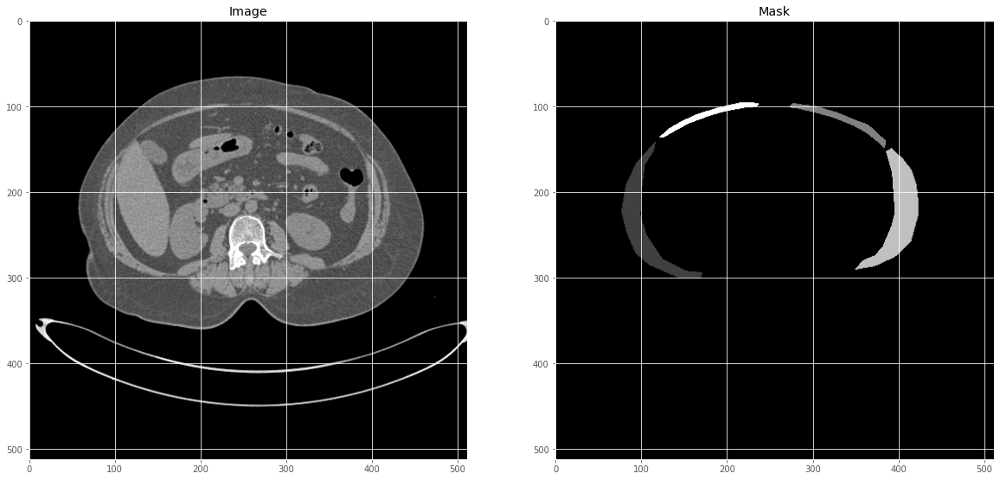

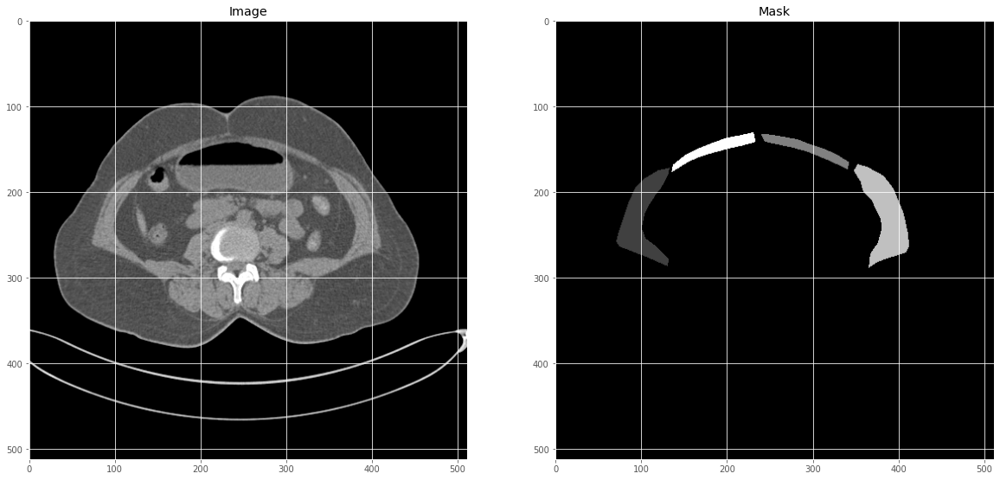

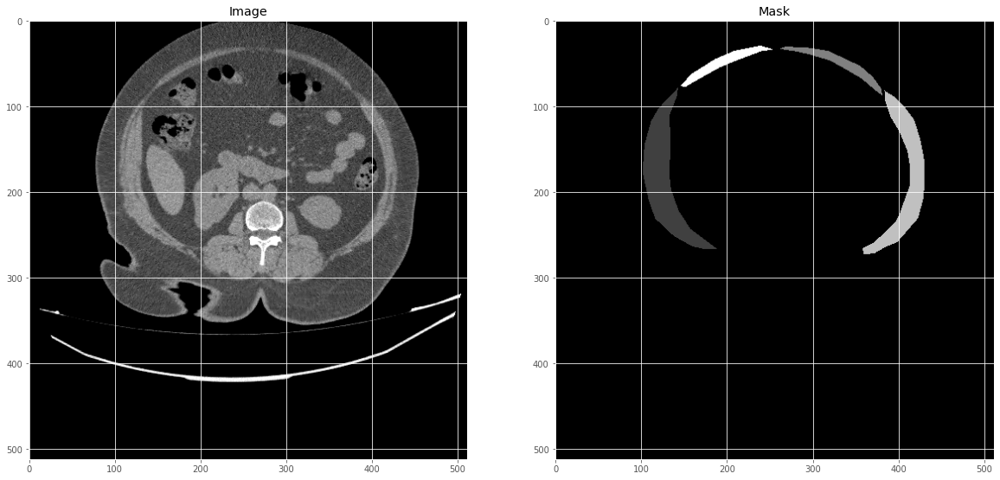

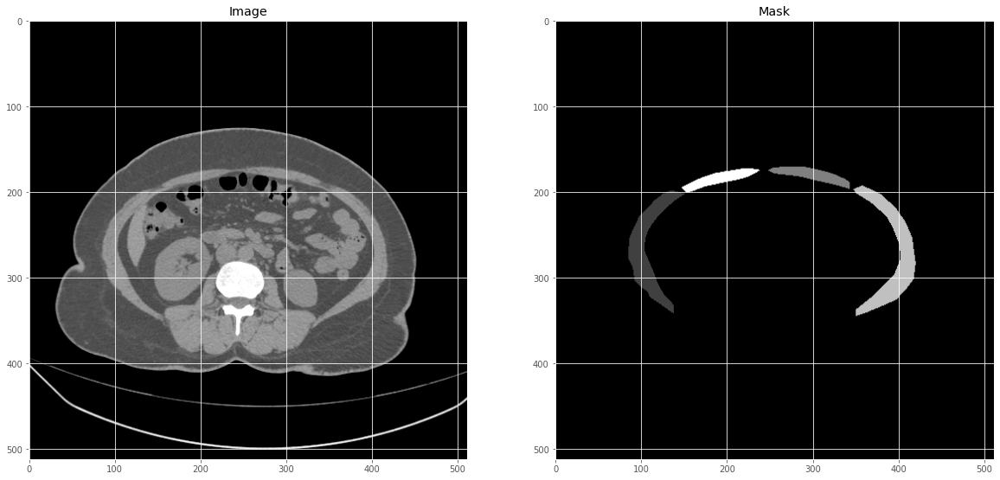

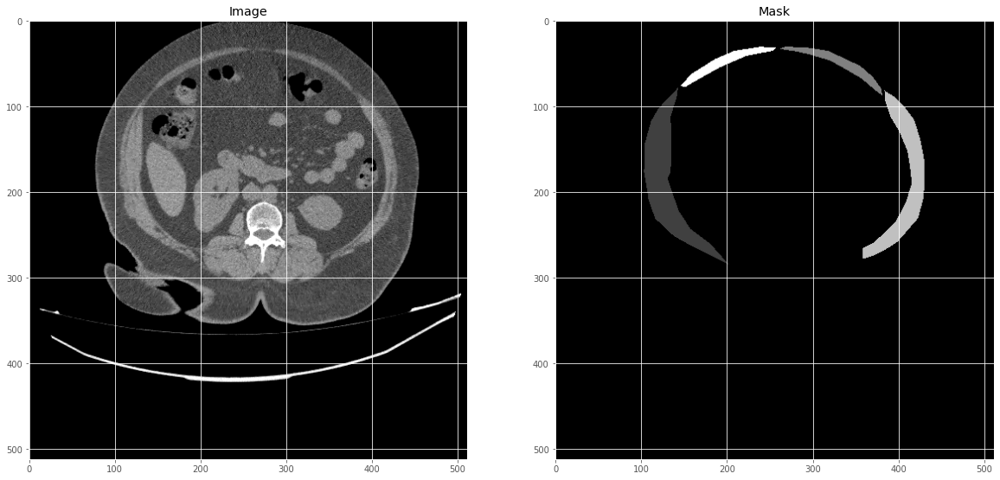

In [24]:
pre_visualize(X_valid, y_valid, valid_text)

							Testing 


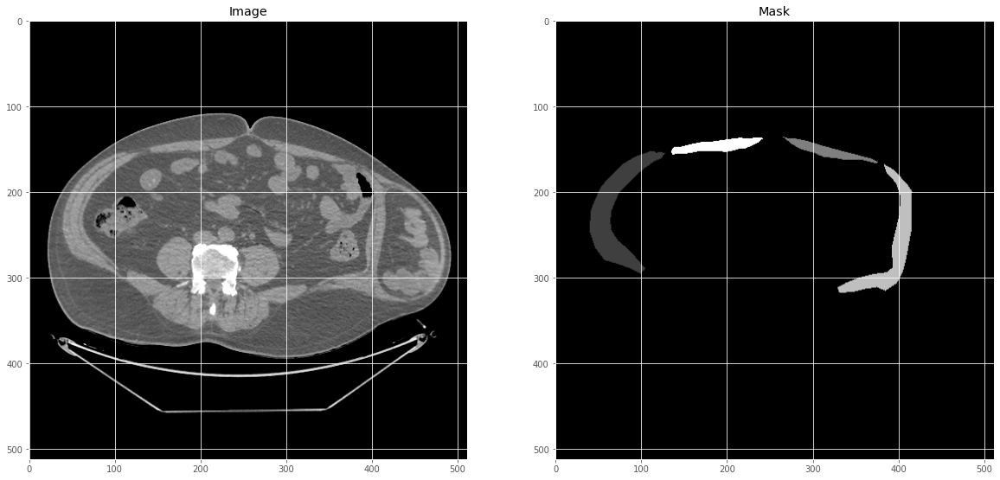

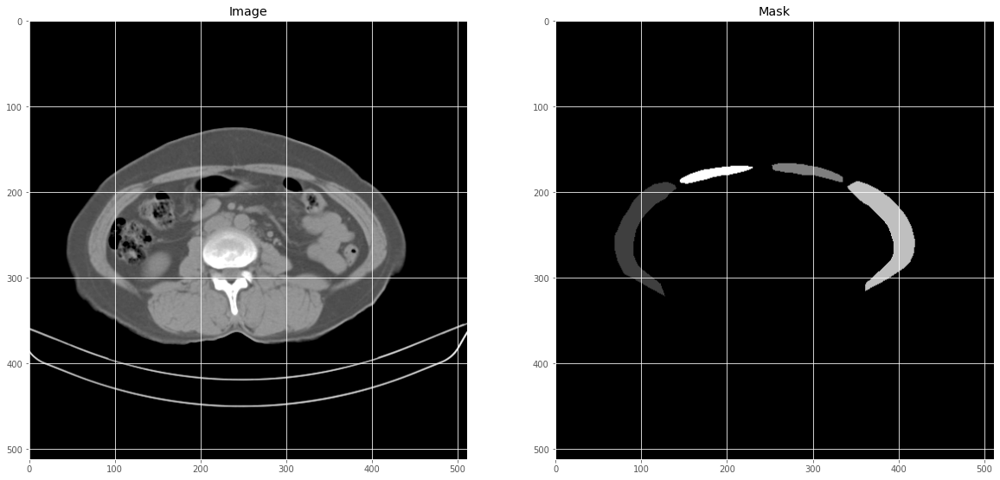

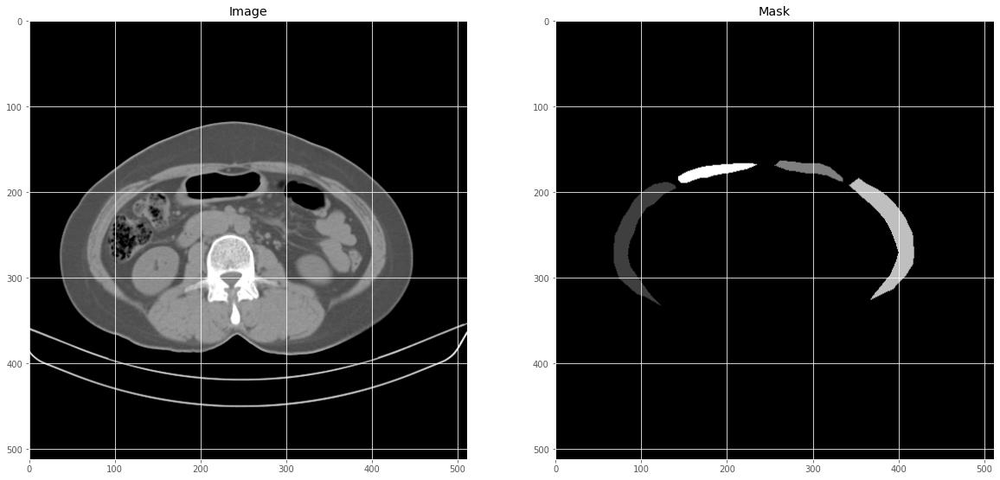

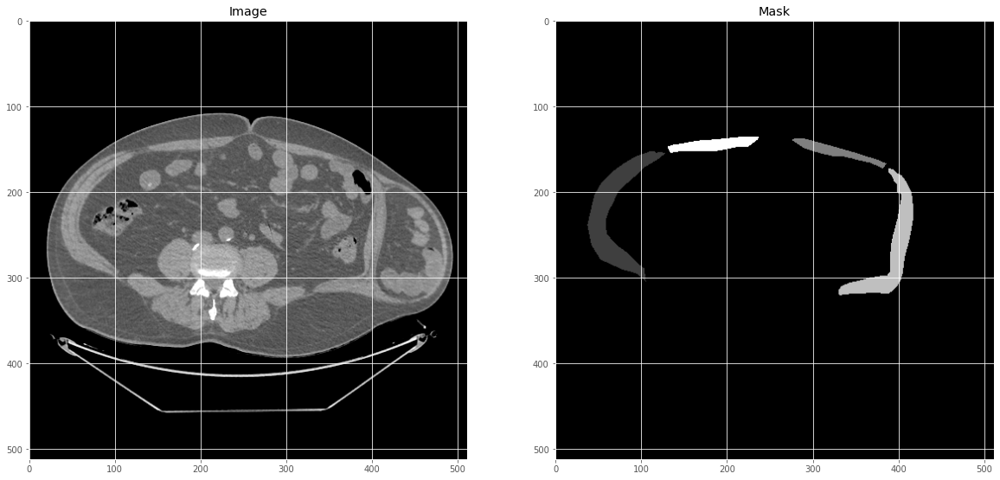

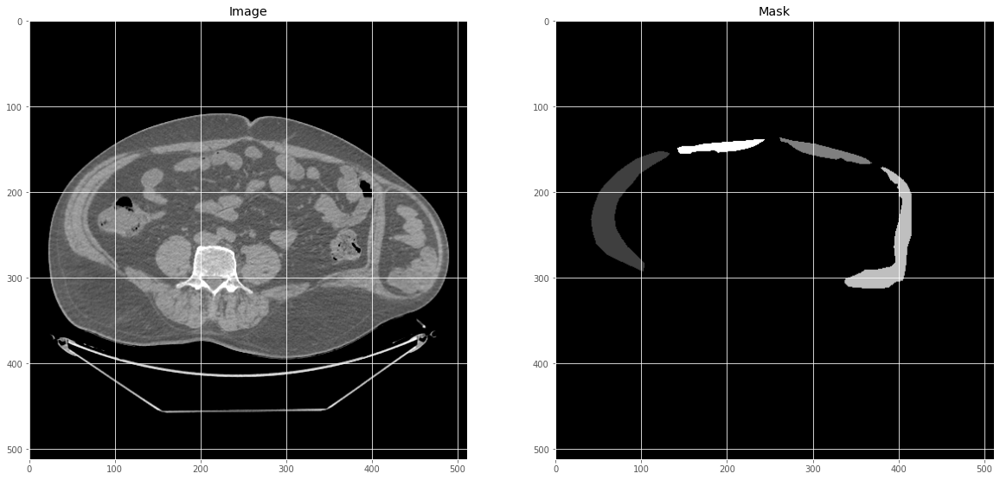

In [25]:
pre_visualize(X_test, y_test, test_text)

In [53]:
print(np.unique(y_train), np.unique(y_valid), np.unique(y_test))

[0 1 2 3 4] [0 1 2 3 4] [0 1 2 3 4]


In [27]:
y_train.shape[3]

1

In [54]:
train_masks_cat = to_categorical(y_train, num_classes=n_classes)
y_train_cat = train_masks_cat.reshape((y_train.shape[0], y_train.shape[1], y_train.shape[2], n_classes))

valid_masks_cat = to_categorical(y_valid, num_classes=n_classes)
y_valid_cat = valid_masks_cat.reshape((y_valid.shape[0], y_valid.shape[1], y_valid.shape[2], n_classes))

test_masks_cat = to_categorical(y_test, num_classes=n_classes)
y_test_cat = test_masks_cat.reshape((y_test.shape[0], y_test.shape[1], y_test.shape[2], n_classes))




#test_masks_cat = to_categorical(y_test, num_classes=n_classes)
#y_test_cat = test_masks_cat.reshape((y_test.shape[0], y_test.shape[1], y_test.shape[2], n_classes))

In [29]:
class_weights = class_weight.compute_class_weight('balanced',
                                                 classes = np.unique(y_encoded),
                                                 y = y_encoded)
print("Class weights are...:", class_weights)


Class weights are...: [ 0.20746934 13.65128841 52.71054486 14.48321784 53.36024318]


In [30]:
def conv2d_block(input_tensor, n_filters, kernel_size = 3, batchnorm = True):
    """Function to add 2 convolutional layers with the parameters passed to it"""
    # first layer
    x = Conv2D(filters = n_filters, kernel_size = (kernel_size, kernel_size),\
              kernel_initializer = 'he_normal', padding = 'same')(input_tensor)
    if batchnorm:
        x = BatchNormalization()(x)
    x = Activation('relu')(x)
    
    # second layer
    x = Conv2D(filters = n_filters, kernel_size = (kernel_size, kernel_size),\
              kernel_initializer = 'he_normal', padding = 'same')(x)
    if batchnorm:
        x = BatchNormalization()(x)
    x = Activation('relu')(x)
    
    return x

In [31]:
def get_unet(input_img, n_filters = 16, dropout = 0.1, batchnorm = True, n_classes = 5):
    """Function to define the UNET Model"""
    # Contracting Path
    c1 = conv2d_block(input_img, n_filters * 1, kernel_size = 3, batchnorm = batchnorm)
    p1 = MaxPooling2D((2, 2))(c1)
    p1 = Dropout(dropout)(p1) 
    
    c2 = conv2d_block(p1, n_filters * 2, kernel_size = 3, batchnorm = batchnorm)
    p2 = MaxPooling2D((2, 2))(c2)
    p2 = Dropout(dropout)(p2)
    
    c3 = conv2d_block(p2, n_filters * 4, kernel_size = 3, batchnorm = batchnorm)
    p3 = MaxPooling2D((2, 2))(c3)
    p3 = Dropout(dropout)(p3)
    
    c4 = conv2d_block(p3, n_filters * 8, kernel_size = 3, batchnorm = batchnorm)
    p4 = MaxPooling2D((2, 2))(c4)
    p4 = Dropout(dropout)(p4)
    
    c5 = conv2d_block(p4, n_filters * 16, kernel_size = 3, batchnorm = batchnorm)
    p5 = MaxPooling2D((2, 2))(c5)
    p5 = Dropout(dropout)(p5)
    
    c6 = conv2d_block(p5, n_filters * 32, kernel_size = 3, batchnorm = batchnorm)
    p6 = MaxPooling2D((2, 2))(c6)
    p6 = Dropout(dropout)(p6)
    
    c7 = conv2d_block(p6, n_filters = n_filters * 64, kernel_size = 3, batchnorm = batchnorm)
    
    # Expansive Path
    
    u8 = Conv2DTranspose(n_filters * 32, (3, 3), strides = (2, 2), padding = 'same')(c7)
    u8 = concatenate([u8, c6])
    u8 = Dropout(dropout)(u8)
    c8 = conv2d_block(u8, n_filters * 32, kernel_size = 3, batchnorm = batchnorm)
    
    u9 = Conv2DTranspose(n_filters * 16, (3, 3), strides = (2, 2), padding = 'same')(c8)
    u9 = concatenate([u9, c5])
    u9 = Dropout(dropout)(u9)
    c9 = conv2d_block(u9, n_filters * 16, kernel_size = 3, batchnorm = batchnorm)
    
    u10 = Conv2DTranspose(n_filters * 8, (3, 3), strides = (2, 2), padding = 'same')(c9)
    u10 = concatenate([u10, c4])
    u10 = Dropout(dropout)(u10)
    c10 = conv2d_block(u10, n_filters * 8, kernel_size = 3, batchnorm = batchnorm)
    
    u11 = Conv2DTranspose(n_filters * 4, (3, 3), strides = (2, 2), padding = 'same')(c10)
    u11 = concatenate([u11, c3])
    u11 = Dropout(dropout)(u11)
    c11 = conv2d_block(u11, n_filters * 4, kernel_size = 3, batchnorm = batchnorm)
    
    u12 = Conv2DTranspose(n_filters * 2, (3, 3), strides = (2, 2), padding = 'same')(c11)
    u12 = concatenate([u12, c2])
    u12 = Dropout(dropout)(u12)
    c12 = conv2d_block(u12, n_filters * 2, kernel_size = 3, batchnorm = batchnorm)
    
    u13 = Conv2DTranspose(n_filters * 1, (3, 3), strides = (2, 2), padding = 'same')(c12)
    u13 = concatenate([u13, c1])
    u13 = Dropout(dropout)(u13)
    c13 = conv2d_block(u13, n_filters * 1, kernel_size = 3, batchnorm = batchnorm)
    
    outputs = Conv2D(n_classes, (1, 1), activation='softmax')(c13)
    model = Model(inputs=[input_img], outputs=[outputs])
    return model

In [32]:
from keras import backend as K


def dice_loss(y_true, y_pred):
    y_true_f = K.flatten(y_true)
    y_pred_f = K.flatten(y_pred)
    intersection = K.sum(y_true_f* y_pred_f)
    val = (2. * intersection + K.epsilon()) / (K.sum(y_true_f * y_true_f) + K.sum(y_pred_f * y_pred_f) + K.epsilon())
    return 1. - val

In [33]:
input_img = Input((im_height, im_width, 1), name='img')
model = get_unet(input_img, n_filters=16, dropout=0.1, batchnorm=True, n_classes = 5)
model.compile(optimizer=Adam(), loss= K.categorical_crossentropy, metrics=["accuracy"])

In [34]:
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 img (InputLayer)               [(None, 512, 512, 1  0           []                               
                                )]                                                                
                                                                                                  
 conv2d (Conv2D)                (None, 512, 512, 16  160         ['img[0][0]']                    
                                )                                                                 
                                                                                                  
 batch_normalization (BatchNorm  (None, 512, 512, 16  64         ['conv2d[0][0]']                 
 alization)                     )                                                             

In [35]:
callbacks = [
    EarlyStopping(patience=10, verbose=1),
    ReduceLROnPlateau(factor=0.1, patience=5, min_lr=0.00001, verbose=1),
    ModelCheckpoint('final_model80_all-tgs-salt.h5', verbose=1, save_best_only=True, save_weights_only=True)
]

In [36]:
y_valid_cat.shape

(46, 512, 512, 5)

In [ ]:
results = model.fit(X_train, y_train_cat, batch_size=16, epochs=80, callbacks=callbacks,\
                    validation_data=(X_valid, y_valid_cat))

Epoch 1/80
12/12 [==============================] - ETA: 0s - loss: 1.3643 - accuracy: 0.6118
Epoch 1: val_loss improved from inf to 297.73087, saving model to final_model80_all-tgs-salt.h5
12/12 [==============================] - 54s 2s/step - loss: 1.3643 - accuracy: 0.6118 - val_loss: 297.7309 - val_accuracy: 0.0388 - lr: 0.0010
Epoch 2/80
12/12 [==============================] - ETA: 0s - loss: 0.9265 - accuracy: 0.8989
Epoch 2: val_loss did not improve from 297.73087
12/12 [==============================] - 13s 1s/step - loss: 0.9265 - accuracy: 0.8989 - val_loss: 609779.0625 - val_accuracy: 0.1215 - lr: 0.0010
Epoch 3/80
12/12 [==============================] - ETA: 0s - loss: 0.7671 - accuracy: 0.9500
Epoch 3: val_loss did not improve from 297.73087
12/12 [==============================] - 13s 1s/step - loss: 0.7671 - accuracy: 0.9500 - val_loss: 36337.2305 - val_accuracy: 0.0158 - lr: 0.0010
Epoch 4/80
12/12 [==============================] - ETA: 0s - loss: 0.6626 - accuracy: 

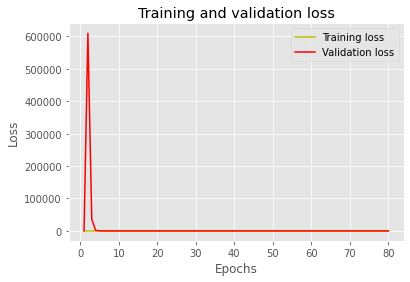

KeyError: ignored

In [ ]:
#plot the training and validation accuracy and loss at each epoch
loss = results.history['loss']
val_loss = results.history['val_loss']
epochs = range(1, len(loss) + 1)
plt.plot(epochs, loss, 'y', label='Training loss')
plt.plot(epochs, val_loss, 'r', label='Validation loss')
plt.title('Training and validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

acc = results.history['acc']
val_acc = results.history['val_acc']

plt.plot(epochs, acc, 'y', label='Training Accuracy')
plt.plot(epochs, val_acc, 'r', label='Validation Accuracy')
plt.title('Training and validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

In [37]:
!unzip "/content/drive/My Drive/Dataset_Capstone/final_model80_all-tgs-salt.h5.zip"

Archive:  /content/drive/My Drive/Dataset_Capstone/final_model80_all-tgs-salt.h5.zip
  inflating: final_model80_all-tgs-salt.h5  


In [38]:
# load the best model
model.load_weights('final_model80_all-tgs-salt.h5')

In [55]:
# Evaluate on validation set (this must be equals to the best log_loss)
model.evaluate(X_train, y_train_cat, verbose=1)
model.evaluate(X_valid, y_valid_cat, verbose=1)
model.evaluate(X_test, y_test_cat, verbose =1)
#model.evaluate(X_test, y_test, verbose=1)

1/1 [==============================] - 7s 7s/step - loss: 0.0537 - accuracy: 0.9880


[0.05366792902350426, 0.9879985451698303]

In [58]:
# Predict on train, val and test
preds_train = model.predict(X_train, verbose=1)
pred_train_argmax=np.argmax(preds_train, axis=3)

preds_val = model.predict(X_valid, verbose=1)
pred_val_argmax=np.argmax(preds_val, axis=3)

preds_test = model.predict(X_test, verbose=1)
pred_test_argmax=np.argmax(preds_test, axis=3)

#preds_test = model.predict(X_test, verbose=1)

1/1 [==============================] - 0s 47ms/step


In [43]:
#Using built in keras function
from keras.metrics import MeanIoU
n_classes = 5
IOU_keras = MeanIoU(num_classes=n_classes)  
IOU_keras.update_state(y_valid[:,:,:,0], pred_val_argmax)
print("Mean IoU =", IOU_keras.result().numpy())


#To calculate I0U for each class...
values = np.array(IOU_keras.get_weights()).reshape(n_classes, n_classes)
print(values)
class1_IoU = values[0,0]/(values[0,0] + values[0,1] + values[0,2] + values[0,3]+values[0,4] + values[1,0]+ values[2,0]+ values[3,0]+values[4,0])
class2_IoU = values[1,1]/(values[1,1] + values[1,0] + values[1,2] + values[1,3]+values[1,4] + values[0,1]+ values[2,1]+ values[3,1]+values[4,1])
class3_IoU = values[2,2]/(values[2,2] + values[2,0] + values[2,1] + values[2,3]+values[2,4] + values[0,2]+ values[1,2]+ values[3,2]+values[4,2])
class4_IoU = values[3,3]/(values[3,3] + values[3,0] + values[3,1] + values[3,2]+values[3,4] + values[0,3]+ values[1,3]+ values[2,3]+values[4,3])
class5_IoU = values[4,4]/(values[4,4] + values[4,0] + values[4,1] + values[4,2]+values[4,3] + values[0,4]+ values[1,4]+ values[2,4]+values[3,4])

print("IoU for class1 is: ", class1_IoU)
print("IoU for class2 is: ", class2_IoU)
print("IoU for class3 is: ", class3_IoU)
print("IoU for class4 is: ", class4_IoU)
print("IoU for class4 is: ", class5_IoU)

Mean IoU = 0.91537297
[[1.1599699e+07 5.1240000e+03 3.5780000e+03 6.7590000e+03 2.1420000e+03]
 [8.6190000e+03 1.7093700e+05 0.0000000e+00 0.0000000e+00 2.0000000e+00]
 [3.7440000e+03 0.0000000e+00 4.3332000e+04 2.0000000e+00 0.0000000e+00]
 [4.7190000e+03 0.0000000e+00 3.3000000e+01 1.6377700e+05 0.0000000e+00]
 [4.3530000e+03 1.0000000e+00 0.0000000e+00 0.0000000e+00 4.1803000e+04]]
IoU for class1 is:  0.99664587
IoU for class2 is:  0.9255698
IoU for class3 is:  0.85486
IoU for class4 is:  0.9343203
IoU for class4 is:  0.8654686


In [59]:
#Using built in keras function
from keras.metrics import MeanIoU
n_classes = 5
IOU_keras = MeanIoU(num_classes=n_classes)  
IOU_keras.update_state(y_test[:,:,:,0], pred_test_argmax)
print("Mean IoU =", IOU_keras.result().numpy())


#To calculate I0U for each class...
values = np.array(IOU_keras.get_weights()).reshape(n_classes, n_classes)
print(values)
class1_IoU = values[0,0]/(values[0,0] + values[0,1] + values[0,2] + values[0,3]+values[0,4] + values[1,0]+ values[2,0]+ values[3,0]+values[4,0])
class2_IoU = values[1,1]/(values[1,1] + values[1,0] + values[1,2] + values[1,3]+values[1,4] + values[0,1]+ values[2,1]+ values[3,1]+values[4,1])
class3_IoU = values[2,2]/(values[2,2] + values[2,0] + values[2,1] + values[2,3]+values[2,4] + values[0,2]+ values[1,2]+ values[3,2]+values[4,2])
class4_IoU = values[3,3]/(values[3,3] + values[3,0] + values[3,1] + values[3,2]+values[3,4] + values[0,3]+ values[1,3]+ values[2,3]+values[4,3])
class5_IoU = values[4,4]/(values[4,4] + values[4,0] + values[4,1] + values[4,2]+values[4,3] + values[0,4]+ values[1,4]+ values[2,4]+values[3,4])

print("IoU for class1 is: ", class1_IoU)
print("IoU for class2 is: ", class2_IoU)
print("IoU for class3 is: ", class3_IoU)
print("IoU for class4 is: ", class4_IoU)
print("IoU for class4 is: ", class5_IoU)

Mean IoU = 0.745032
[[6.530219e+06 1.108200e+04 9.252000e+03 2.220100e+04 5.551000e+03]
 [7.127000e+03 8.895300e+04 0.000000e+00 0.000000e+00 5.810000e+02]
 [1.613000e+03 0.000000e+00 2.143900e+04 1.216000e+03 0.000000e+00]
 [1.816500e+04 3.500000e+02 1.110000e+02 7.371900e+04 5.440000e+02]
 [3.672000e+03 1.420000e+02 1.850000e+02 7.000000e+00 1.961500e+04]]
IoU for class1 is:  0.98809737
IoU for class2 is:  0.8218506
IoU for class3 is:  0.6339898
IoU for class4 is:  0.6337985
IoU for class4 is:  0.64742386


In [63]:
#Function for viewing plots and predictions
def plot_sample(X, y, preds,text, ix=None):
    """Function to plot the results"""
    print(text) 
    
    for i in range(5) : 
        if ix is None:
            ix = random.randint(0, len(X)-1)
            
        fig, ax = plt.subplots(1, 3, figsize=(25, 15))
        ax[0].imshow(X[ix], cmap='gray')
        ax[0].set_title('Input')

        ax[1].imshow(y[ix].squeeze(),cmap='gray')
        ax[1].set_title('Mask')


        ax[2].imshow(preds[ix].squeeze(),cmap='gray')
        ax[2].set_title('Mask Predicted')
        
        #d_loss = dice_loss(y[ix],preds[ix]).numpy()
        #d_loss = round(d_loss*100, 3)
        
        #i_loss = iou_loss(y[ix],preds[ix]).numpy()
        #i_loss = round(i_loss*100, 3)
        
        #text_1 = "Dice loss of image " + str(ix) +  " = " + str(d_loss) + " %"
        #text_2 = "IoU loss of image " + str(ix) +  " = " + str(i_loss) + " %"
        #plt.figtext(0.4, 0.2, text_1, fontsize=18)
        #plt.figtext(0.4, 0.18, text_2, fontsize=18)
        
        ix = None

						Training 


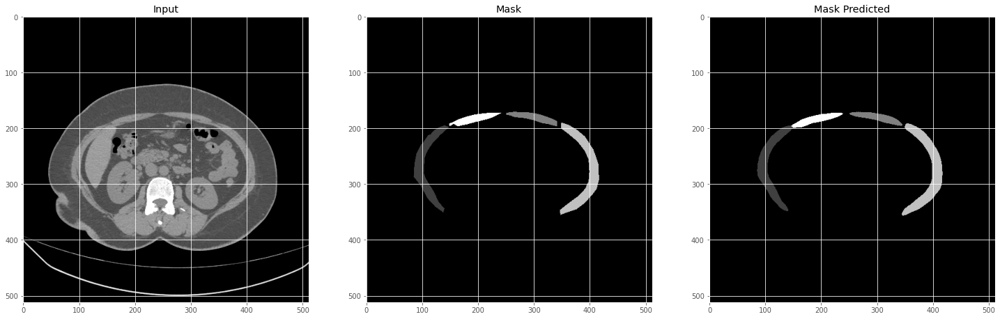

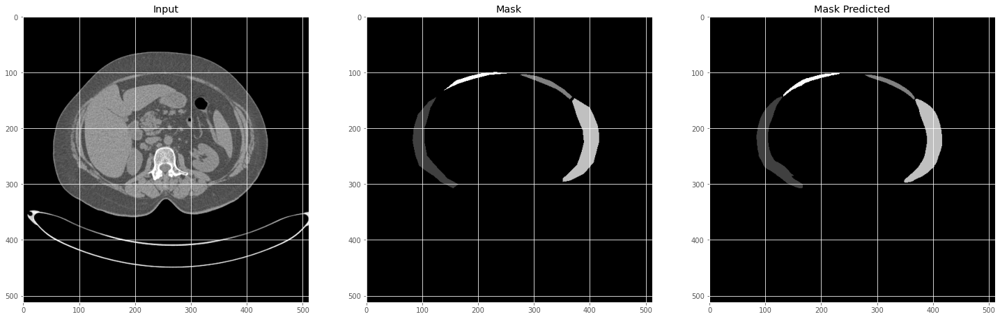

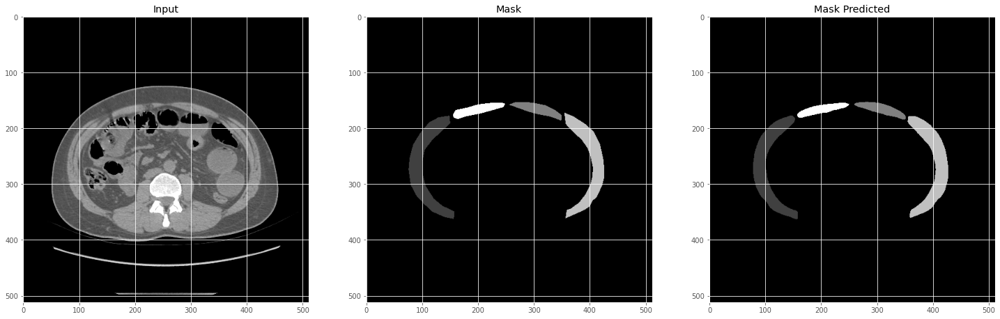

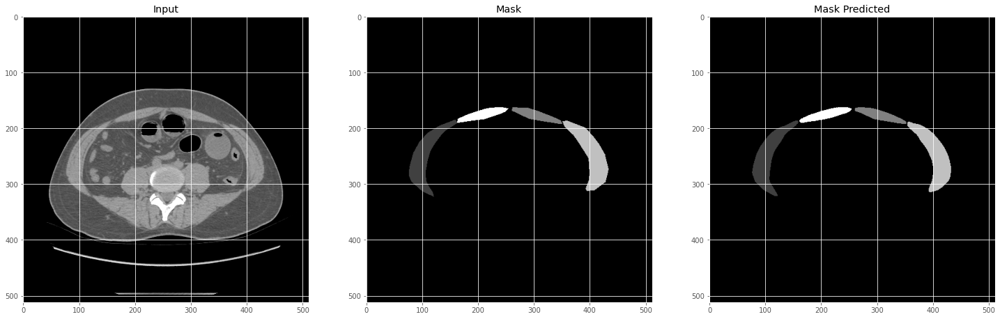

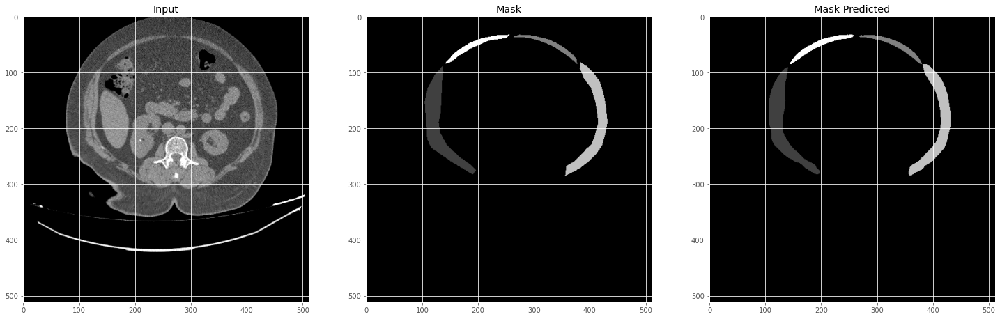

In [64]:
plot_sample(X_train, y_train, pred_train_argmax, train_text)

						Validation 


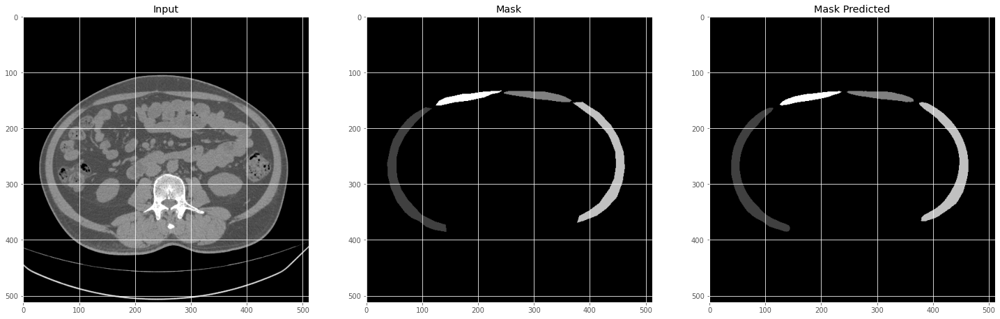

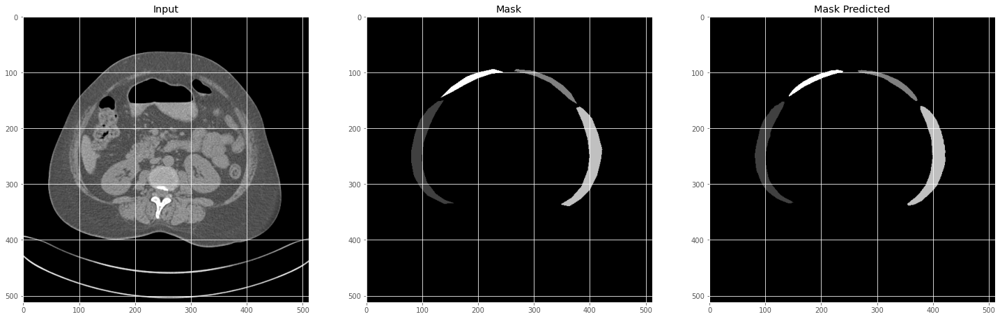

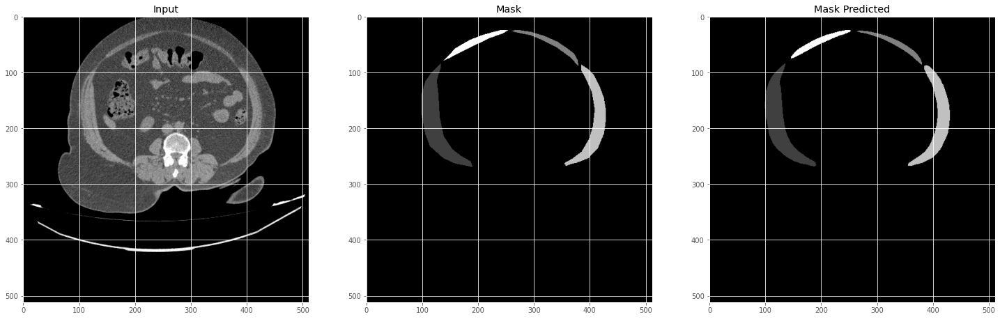

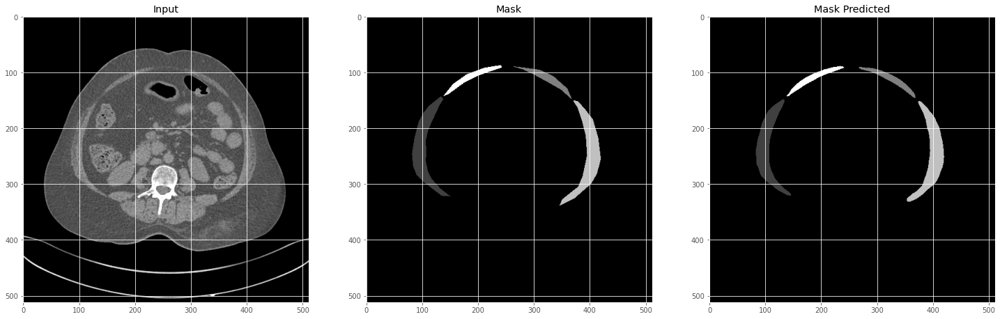

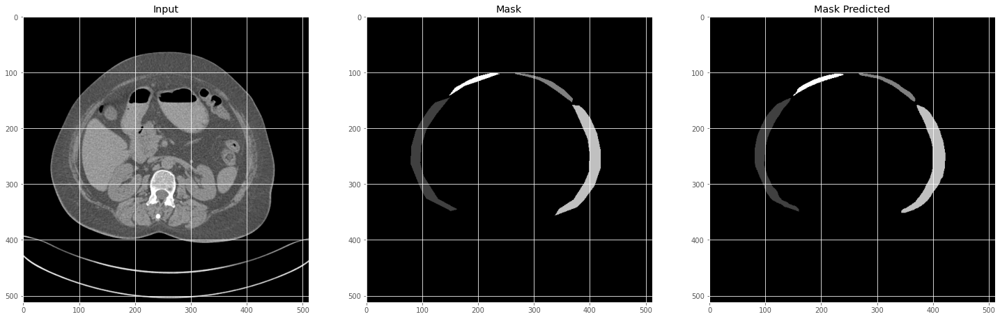

In [50]:
plot_sample(X_valid, y_valid, pred_val_argmax, valid_text)

							Testing 


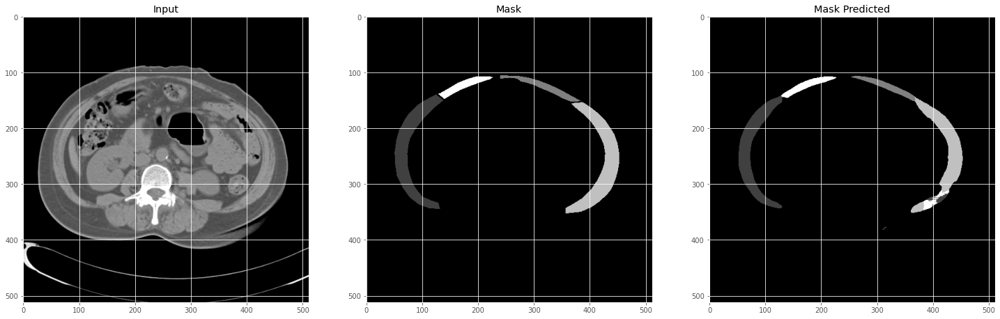

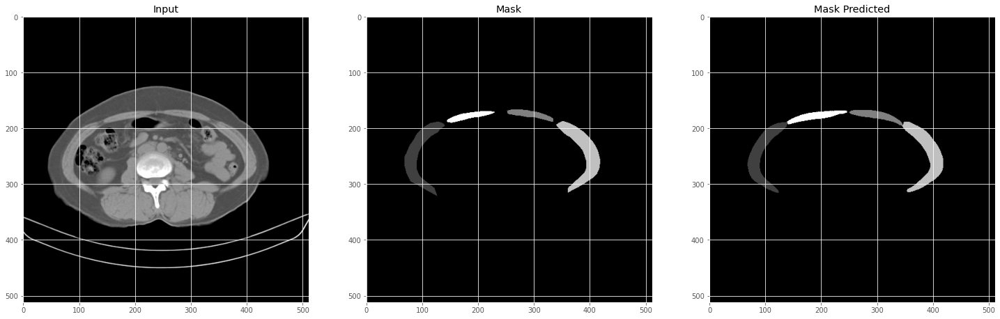

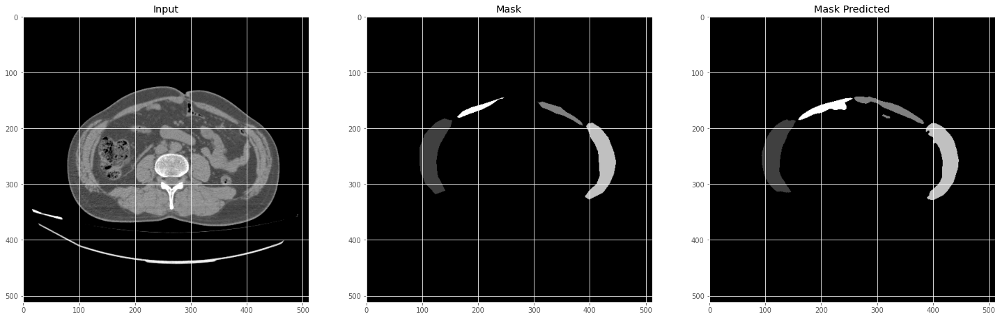

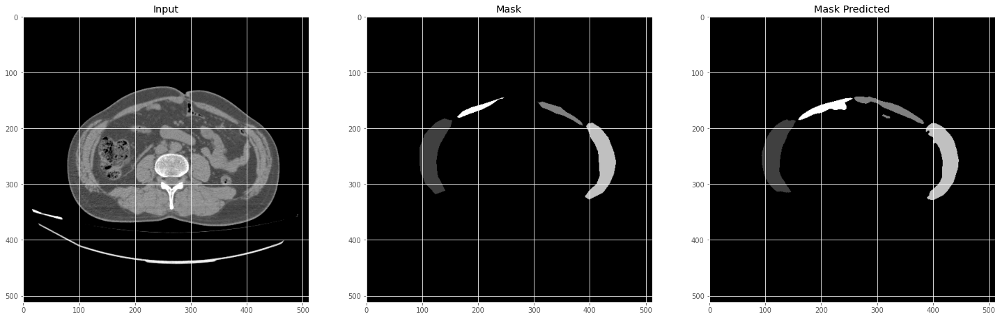

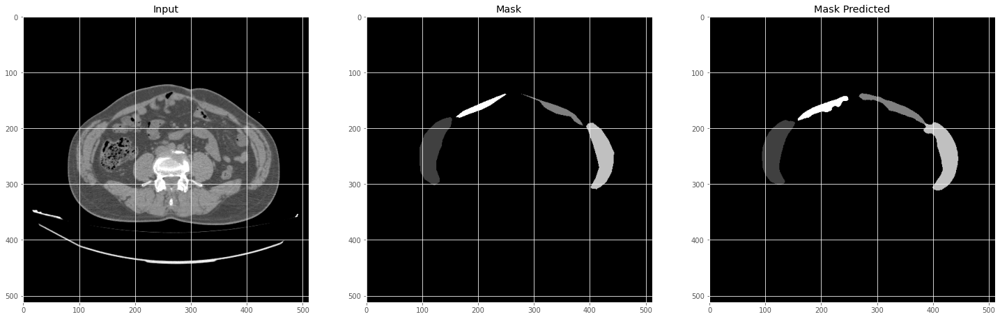

In [60]:
plot_sample(X_test, y_test, pred_test_argmax, test_text)

In [ ]:
def avg_loss():
    d_loss_train = 0
    d_loss_valid = 0
    d_loss_test = 0

    temp = 0

    d_loss_train_list = []
    d_loss_valid_list = []
    d_loss_test_list = []
    
    for i in tqdm(range(0,len(X_train))):
        #temp = resize(preds_train[i], (512, 512, 1), mode = 'constant', preserve_range = True)
        #temp_2 = temp_2/255.0
        d_loss_train = dice_loss(y_train[i],preds_train[i]).numpy()
        d_loss_train_list.append(d_loss_train)
        
    #d_loss_train_std = statistics.stdev(d_loss_train_list)
    #d_loss_train_avg = statistics.mean(d_loss_train_list)
    
    temp = 0
    
    
    for i in tqdm(range(0,len(X_valid))):
        #temp = resize(preds_val[i], (512, 512, 1), mode = 'constant', preserve_range = True)
        #temp_2 = temp_2/255.0
        d_loss_valid = dice_loss(y_valid[i],preds_val[i]).numpy()
        d_loss_valid_list.append(d_loss_valid)
        
    temp = 0
    
    for i in tqdm(range(0,len(X_test))):
        #temp = resize(preds_test[i], (512, 512, 1), mode = 'constant', preserve_range = True)
        #temp_2 = temp_2/255.0
        d_loss_test = dice_loss(y_test[i],preds_test[i]).numpy()
        d_loss_test_list.append(d_loss_test)
        
        

    #d_loss_valid_std = statistics.stdev(d_loss_valid_list)
    #d_loss_valid_avg = statistics.mean(d_loss_valid_list)
    return d_loss_train_list, d_loss_valid_list, d_loss_test_list
#d_loss_train_avg,d_loss_valid_avg,d_loss_train_std,d_loss_valid_std

In [ ]:
a,b,c = avg_loss() #List of training and validation values
print(len(a),len(b), len(c))

100%|█████████████████████████████████████████████████████████████████████████████████| 26/26 [00:00<00:00, 302.26it/s]

360 91 26


In [ ]:
case_1 = c[:5:]
case_5 = c[5:10:]
case_3 = c[10:15:]
case_4 = c[15:21:]
case_2 = c[21::]

In [ ]:
import statistics
print("Mean Dice loss of custom-100 U-Net for training: ",statistics.mean(a), " Max : ", max(a), "Min :", min(a))
print("Mean Dice loss of custom-100 U-Net for valid: ",statistics.mean(b), "Max : ", max(b), "Min : ", min(b))

Mean Dice loss of custom-100 U-Net for training:  0.023343066  Max :  0.044245422 Min : 0.015449822
Mean Dice loss of custom-100 U-Net for valid:  0.035214063 Max :  0.06984943 Min :  0.018490016


In [ ]:
print("Mean Dice loss of custom-100 U-Net for test-1: ",statistics.mean(case_1), "Max : ", max(case_1), "Min : ", min(case_1))
print("Mean Dice loss of custom-100 U-Net for test-2: ",statistics.mean(case_2), "Max : ", max(case_2), "Min : ", min(case_2))
print("Mean Dice loss of custom-100 U-Net for test-3: ",statistics.mean(case_3), "Max : ", max(case_3), "Min : ", min(case_3))
print("Mean Dice loss of custom-100 U-Net for test-4: ",statistics.mean(case_4), "Max : ", max(case_4), "Min : ", min(case_4))
print("Mean Dice loss of custom-100 U-Net for test-5: ",statistics.mean(case_5), "Max : ", max(case_5), "Min : ", min(case_5))

Mean Dice loss of custom-100 U-Net for test-1:  0.1629959 Max :  0.20095581 Min :  0.13180673
Mean Dice loss of custom-100 U-Net for test-2:  0.08518515 Max :  0.09171295 Min :  0.075518966
Mean Dice loss of custom-100 U-Net for test-3:  0.09271431 Max :  0.106744945 Min :  0.07516074
Mean Dice loss of custom-100 U-Net for test-4:  0.0909833 Max :  0.11541277 Min :  0.07203126
Mean Dice loss of custom-100 U-Net for test-5:  0.4152006 Max :  0.45558065 Min :  0.3901223


In [ ]:
case_1 = c[:5:]
case_2 = c[5:10:]
case_3 = c[10:15:]
case_4 = c[15:21:]
case_5 = c[21::]
import statistics
print("Mean Dice loss of Custom U-Net for training: ",statistics.mean(a), " Max : ", max(a), "Min :", min(a))
print("Mean Dice loss of Custom U-Net for valid: ",statistics.mean(b), "Max : ", max(b), "Min : ", min(b))
print("Mean Dice loss of Custom U-Net for test-1: ",statistics.mean(case_1), "Max : ", max(case_1), "Min : ", min(case_1))
print("Mean Dice loss of Custom U-Net for test-2: ",statistics.mean(case_5), "Max : ", max(case_5), "Min : ", min(case_5))
print("Mean Dice loss of Custom U-Net for test-3: ",statistics.mean(case_3), "Max : ", max(case_3), "Min : ", min(case_3))
print("Mean Dice loss of Custom U-Net for test-4: ",statistics.mean(case_4), "Max : ", max(case_4), "Min : ", min(case_4))

Mean Dice loss of Custom U-Net for training:  0.023343066  Max :  0.044245422 Min : 0.015449822
Mean Dice loss of Custom U-Net for valid:  0.035214063 Max :  0.06984943 Min :  0.018490016
Mean Dice loss of Custom U-Net for test-1:  0.1629959 Max :  0.20095581 Min :  0.13180673
Mean Dice loss of Custom U-Net for test-2:  0.08518515 Max :  0.09171295 Min :  0.075518966
Mean Dice loss of Custom U-Net for test-3:  0.09271431 Max :  0.106744945 Min :  0.07516074
Mean Dice loss of Custom U-Net for test-4:  0.0909833 Max :  0.11541277 Min :  0.07203126


In [ ]:
test_folders

['SS_EA001', 'SS_EA002', 'SS_EA025', 'SS_EA034', 'SS_EA041']

In [ ]:
#Function for viewing plots and predictions
def final_sample(X, y, preds,text, ix=None):
    """Function to plot the results"""
    print(text) 
    
    for i in range(5) : 
        if ix is None:
            ix = random.randint(0, len(X)-1)
            
        fig, ax = plt.subplots(1, 3, figsize=(25, 15))
        ax[0].imshow(X[ix], cmap='gray')
        ax[0].set_title('Input')

        ax[1].imshow(y[ix].squeeze(),cmap='gray')
        ax[1].set_title('Mask')


        ax[2].imshow(preds[ix].squeeze(),cmap='gray')
        ax[2].set_title('Mask Predicted')
        
        d_loss = dice_loss(y[ix],preds[ix]).numpy()
        d_loss = round(d_loss*100, 3)
        
        #i_loss = iou_loss(y[ix],preds[ix]).numpy()
        #i_loss = round(i_loss*100, 3)
        
        text_1 = "Complete loss of image " + str(ix) +  " = " + str(d_loss) + " %"
        #text_2 = "IoU loss of image " + str(ix) +  " = " + str(i_loss) + " %"
        plt.figtext(0.4, 0.27, text_1, fontsize=18)
        #plt.figtext(0.4, 0.18, text_2, fontsize=18)
        
        ix = None

						Validation 


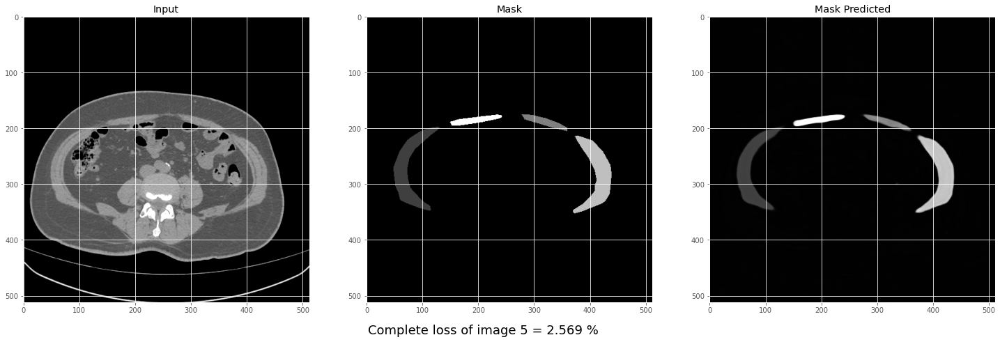

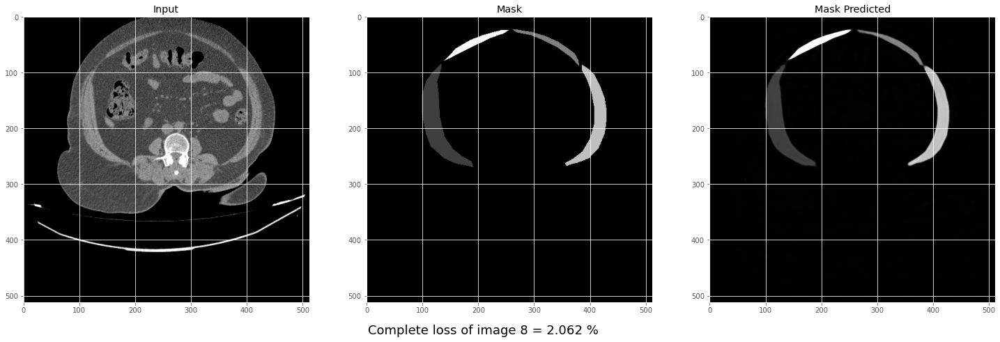

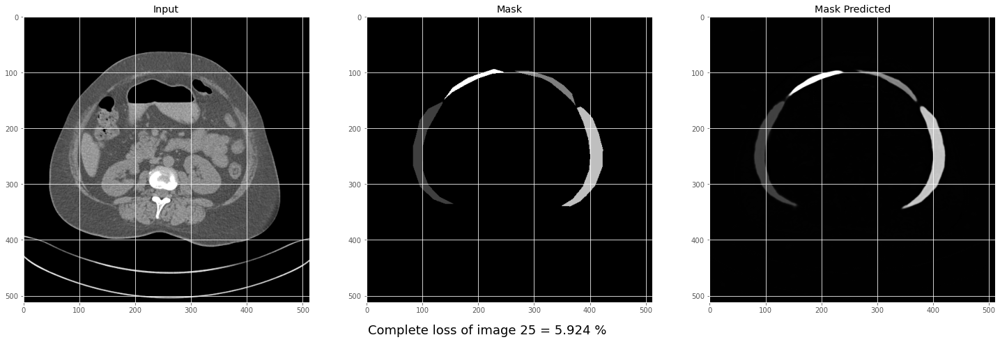

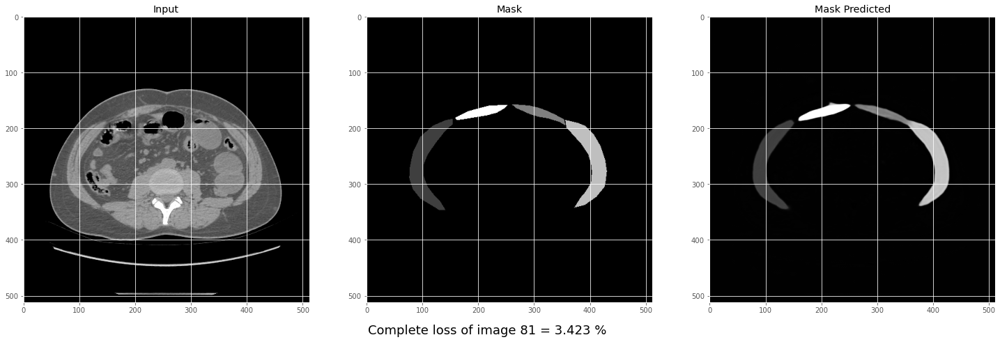

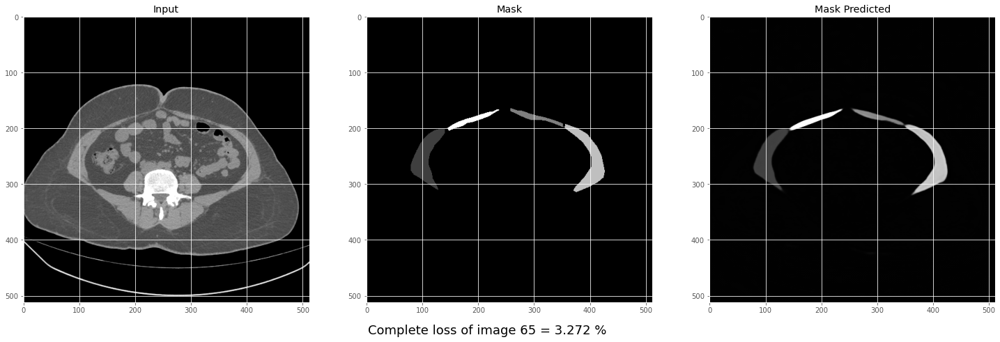

In [ ]:
final_sample(X_valid, y_valid, preds_val,valid_text)

In [ ]:
#Function for viewing plots and predictions
def test_sample(X, y, preds,text, ix=None):
    """Function to plot the results"""
    print(text) 
    
    for i in range(len(X)) : 
        ix = i
            
        fig, ax = plt.subplots(1, 3, figsize=(25, 15))
        ax[0].imshow(X[ix], cmap='gray')
        ax[0].set_title('Input')

        ax[1].imshow(y[ix].squeeze(),cmap='gray')
        ax[1].set_title('Mask')


        ax[2].imshow(preds[ix].squeeze(),cmap='gray')
        ax[2].set_title('Mask Predicted')
        
        d_loss = dice_loss(y[ix],preds[ix]).numpy()
        d_loss = round(d_loss*100, 3)
        
        #i_loss = iou_loss(y[ix],preds[ix]).numpy()
        #i_loss = round(i_loss*100, 3)
        
        text_1 = "Dice loss of image " + str(ix) +  " = " + str(d_loss) + " %"
        #text_2 = "IoU loss of image " + str(ix) +  " = " + str(i_loss) + " %"
        plt.figtext(0.4, 0.27, text_1, fontsize=18)
        #plt.figtext(0.4, 0.18, text_2, fontsize=18)
        
        #ix = None

							Testing 


C:\Users\adity\AppData\Local\Temp/ipykernel_7940/882255460.py:9: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(1, 3, figsize=(25, 15))


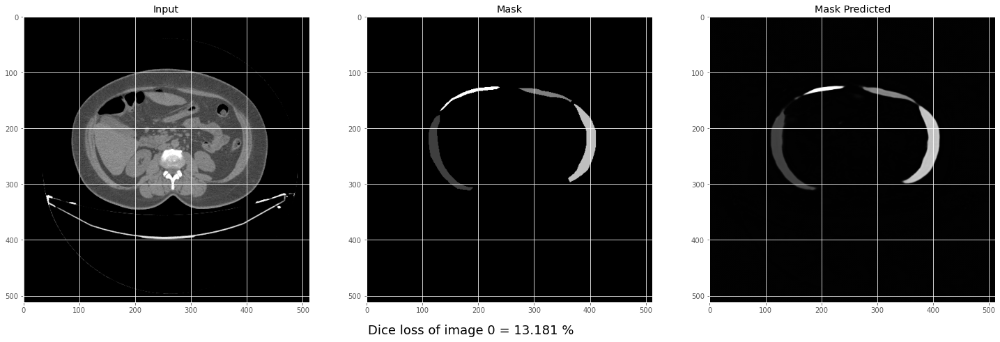

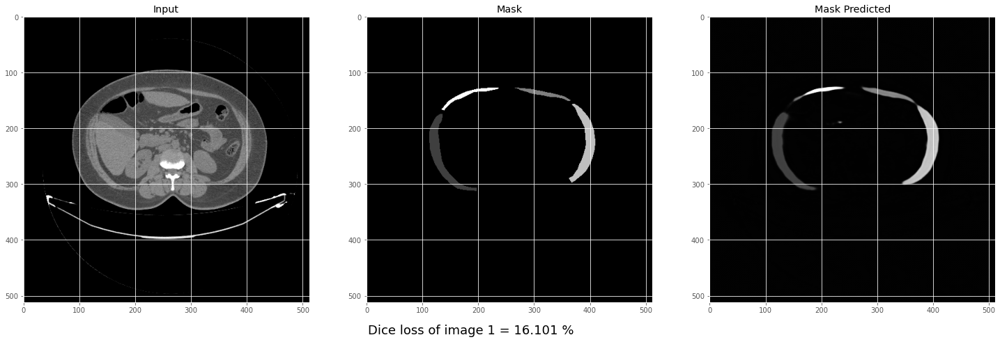

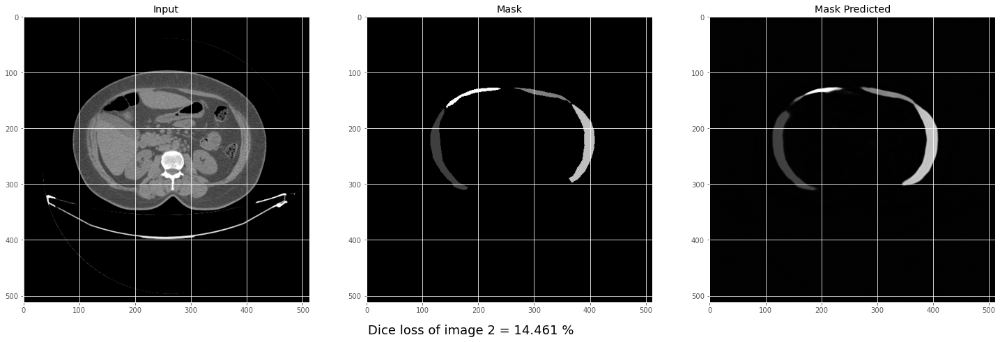

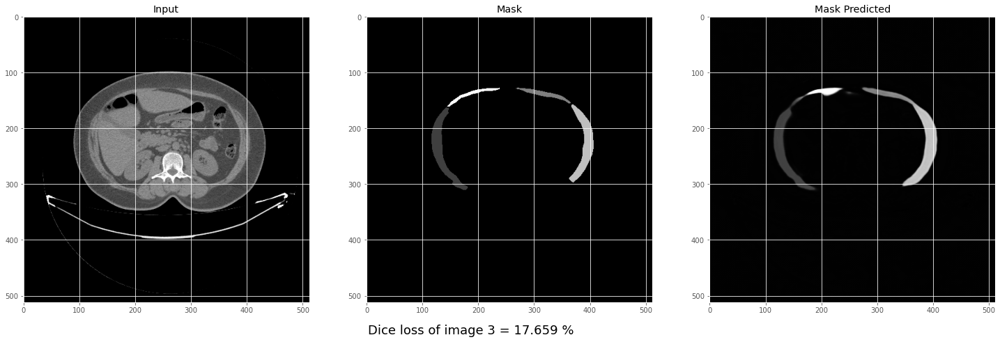

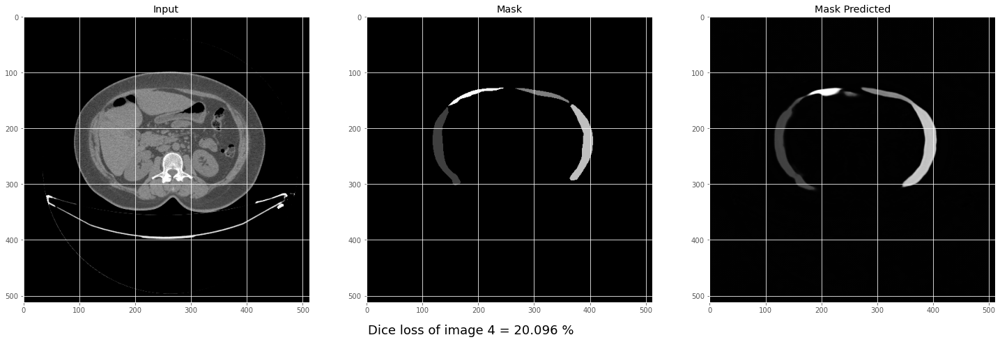

...

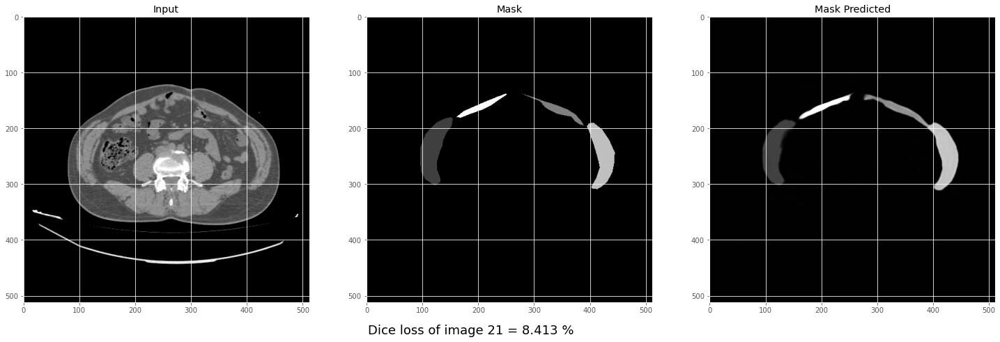

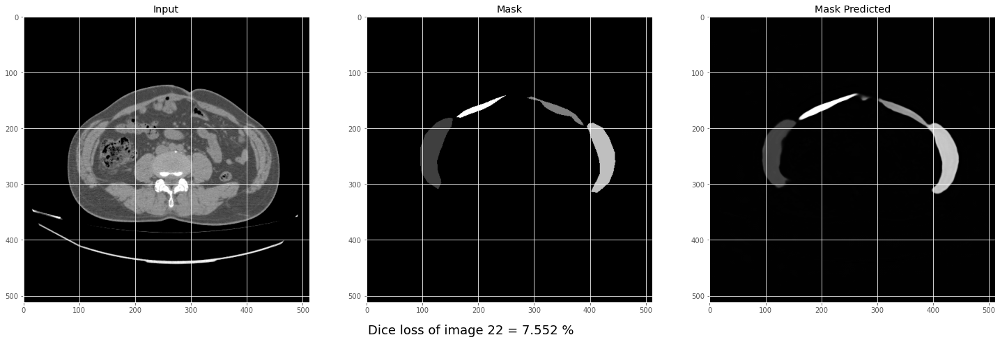

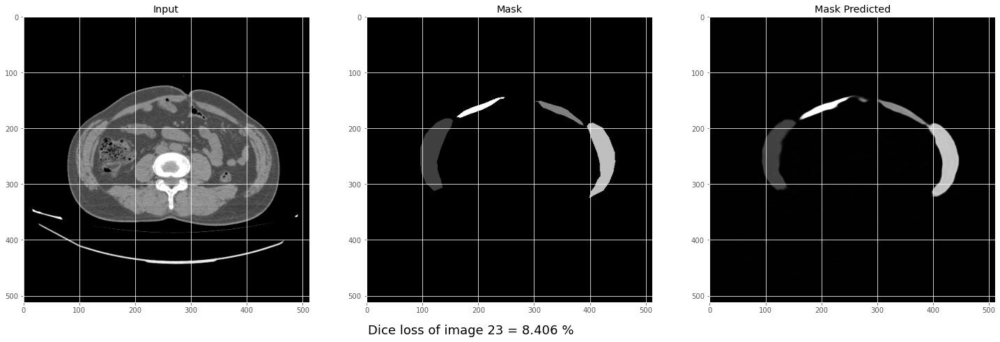

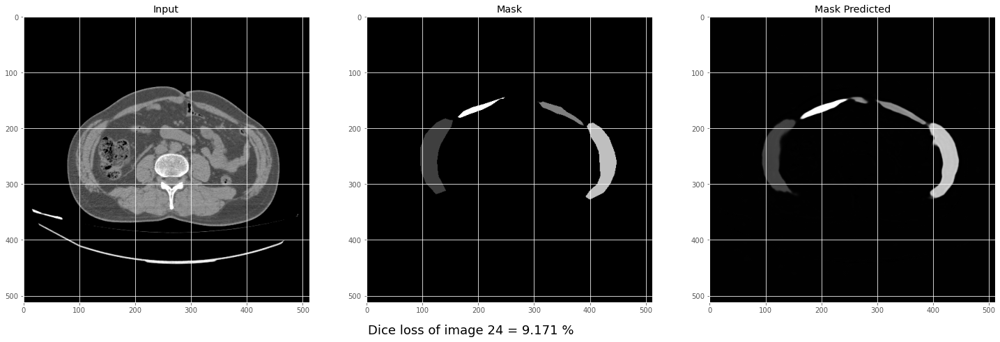

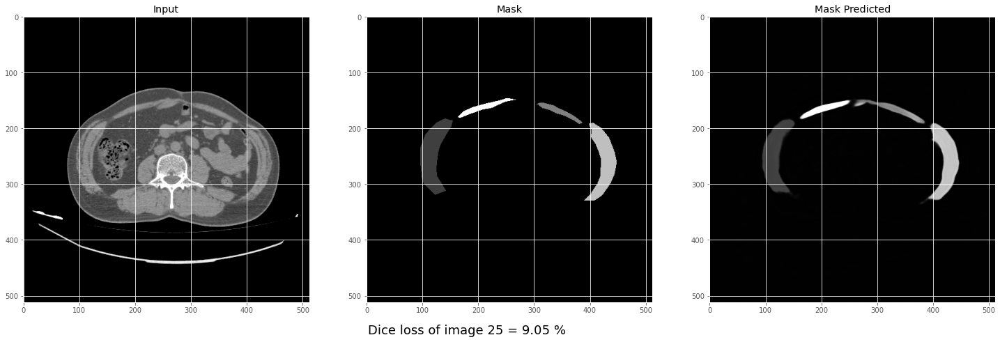

In [ ]:
test_sample(X_test, y_test, preds_test,test_text)